# Traffic lane marking detection
In this assignment, you will use image processing techniques and the Hough Transform to identify traffic lane markings in a series of test images. \
There are 5 sets of images in total. Start with set 1, and then review the other sets (some are more difficult than others)


## Submission Details
Assignment deadline: Midnight, Sunday 10 November \
Jupyter Notebook containing submission to be submitted via Canvas \
Total grade: 20% of final module mark \
Submit the assignment as a notebook (i.e. .iynb file) \
Use the following format for your filename: firstname_lastname_assignment3.ipynb

# Submission details
### Name: Michael Rice
### ID: 20347541
### Class code: MAI

In [81]:
# install required libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import random
import glob
%matplotlib inline


## Load test images


In [82]:
# read images
input_paths = ['images/set_1/','images/set_2/','images/set_3/','images/set_4/','images/set_5/']

raw_images_sets = []

#reading in raw images in their individual sets
for path in input_paths:
    raw_images = []
    filenames = [path + filename for filename in os.listdir(path)]
    raw_images = [cv2.imread(filename) for filename in filenames]
    raw_images_sets.append(raw_images)


sets = raw_images_sets




In this section I define 5 functions to help me throughout the assignment.
- A function to randomly plot large images from any number of image sets.
- A function to create a plot of all 5 images, but smaller, from any number of image sets. 
- A function to calculate the edge density of an image (edge pixels versus non-edge pixels as a ratio).
- A function to calculate the contrast of an image.
- A function to calculate a vertical edge histogram of an image.

In [83]:
#helper functions 


#plot n  randomly selected images in larger format from a given set or sets 
def plot_random_image_from_sets(image_sets, num_images):
    if isinstance(image_sets, list) and all(isinstance(i, list) for i in image_sets):
        pass
    else:
        image_sets = [image_sets]

    for image_set in image_sets:
        selected_indices = set()
        for _ in range(num_images):
            while True:
                random_index = random.randint(0, len(image_set) - 1)
                if random_index not in selected_indices:
                    selected_indices.add(random_index)
                    break
            random_image = image_set[random_index]
            plt.figure(figsize=(8,6))
            plt.imshow(random_image, cmap='gray')
            plt.axis('off')
            plt.show()
            plt.close()


# plots one figure of all five images from a set or sets in a smaller format 
def plot_images_from_sets(image_sets, images_per_row=5, max_images=5):
    if isinstance(image_sets, list) and all(isinstance(i, list) for i in image_sets):
        pass
    else:
        image_sets = [image_sets]
        
    for image_set in image_sets:
        for i in range(0, min(len(image_set), max_images), images_per_row):
            plt.figure(figsize=(30, 16))
            for j in range(images_per_row):
                if i + j < min(len(image_set), max_images):
                    plt.subplot(1, images_per_row, j + 1)
                    plt.imshow(image_set[i + j], cmap='gray')
                    plt.axis('off')
            plt.show()
            plt.close()


#computers the edge density of an image using a standardised Canny implementation
def calculate_edge_density(image):

    edges = cv2.Canny(image, 50, 150) 
    edge_pixels = np.sum(edges > 0)  # Count edge pixels
    total_pixels = image.shape[0] * image.shape[1]
    density = edge_pixels / total_pixels  # Edge density as a ratio
    return density


# computes image contrast (sd of pixel intensities)
def calculate_contrast(image):

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image
    contrast = np.std(gray) #std dev

    return contrast

# computes the histogram of edge pixels in the y coordinate plane, potentially useful for detecting lanes, again with a standard Canny implementation
def calculate_vertical_edge_histogram(image):

    edges = cv2.Canny(image, 50, 150) #standard canny implementation
    edge_y_coords = np.where(edges > 0)[0] #all y edge coords
    hist, _ = np.histogram(edge_y_coords, bins=20, range=(0, image.shape[0])) #hist creation
    peak_y = np.argmax(hist)
    return peak_y * (image.shape[0] // 20) 




## Convert the images to greyscale

image shapes :  [(540, 960), (720, 1280), (720, 1280), (720, 1280), (720, 1280)]
image sizes :  [518400, 921600, 921600, 921600, 921600]
mean contrast of each set :  [37.56327709122441, 59.53710751764764, 59.548215569146976, 69.78904907785702, 54.6872755830956]
mean edge densities of each set :  [0.027782793209876543, 0.04069422743055555, 0.03978797743055555, 0.020396267361111112, 0.08531076388888889]
mean vertical edge hist value of each set :  [297.0, 288.0, 252.0, 252.0, 396.0]


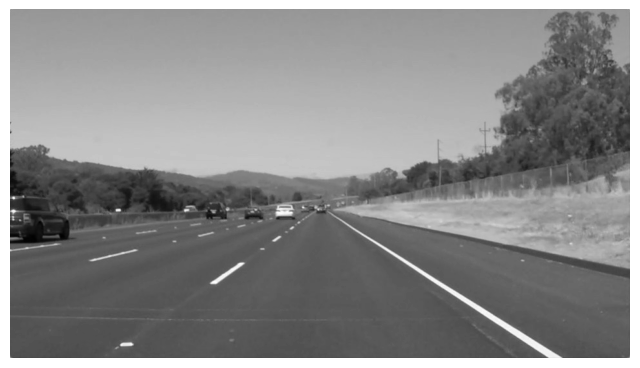

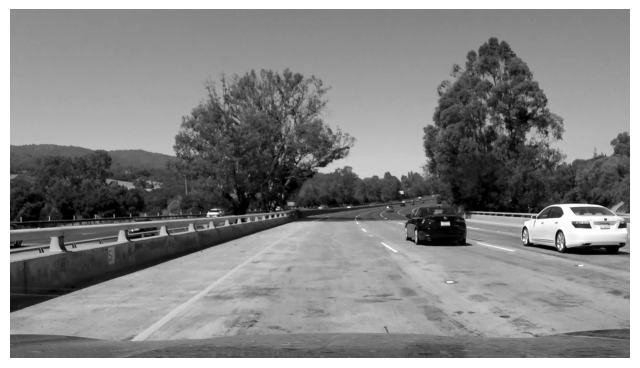

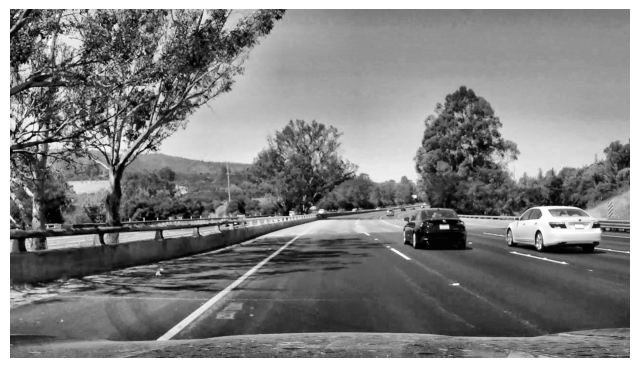

In [84]:
# take all the images in the list and create a list of greyscale images
grey_images_sets = []

# populate grey_images as a list of greyscale images
for s in sets:
    grey_images = []
    for img in s:
        grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        grey_images.append(grey)
    grey_images_sets.append(grey_images)


mean_contrast_sets, mean_edge_densities, mean_vertical_edge_hist = [], [], []
image_shapes,image_sizes = [],[]

#calculating shape,size,contrast,edge density and vertical edge histogram for each grey image
for grey_set in grey_images_sets:
    shape = np.shape(grey_set[0])
    image_shapes.append(shape)
    image_sizes.append(shape[0]*shape[1])

    contrast_values = [calculate_contrast(img) for img in grey_set]
    edge_densities = [calculate_edge_density(img) for img in grey_set]
    vert_edge_hist = [calculate_vertical_edge_histogram(img) for img in grey_set]
    
    mean_contrast_sets.append(np.mean(contrast_values))
    mean_edge_densities.append(np.mean(edge_densities))
    mean_vertical_edge_hist.append(np.mean(vert_edge_hist))


#printing mean image characteristics for each set of images
print(f'image shapes : ',image_shapes)
print(f'image sizes : ',image_sizes)
print(f'mean contrast of each set : ',mean_contrast_sets)
print(f'mean edge densities of each set : ',mean_edge_densities)
print(f'mean vertical edge hist value of each set : ',mean_vertical_edge_hist)



# plot_images_from_sets(grey_images_sets[0:5])
plot_random_image_from_sets(grey_images_sets[0], 1)
plot_random_image_from_sets(grey_images_sets[4], 1)



# contrast enhancement augmentation for set 5 in an attempt to increase low contrast boundaries

grey_set5 = grey_images_sets[4]
clahe_set5 = []

for img_grey in grey_set5:

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_image = clahe.apply(img_grey)
    clahe_set5.append(clahe_image)
grey_images_sets[4] = clahe_set5

plot_random_image_from_sets(grey_images_sets[4], 1)

    



## Apply Gaussian blur
Gaussian blur reduces noise and weak edges. In principle, only sharper, more defined edges (i.e. road markings) will remain\

The image should look something like this:
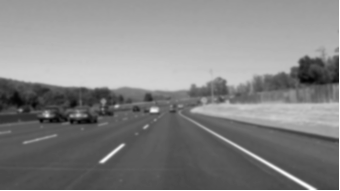

---------------------------------------------------

In this cell I used the previously calculated set characteristics to determine the level of blurring applied to the image, namely the image's contrast and edge density. If an image had high contrast and lower edge density, I applied a weaker blurring, so as to not rid the image of important edges. Conversely, if a high edge density was detected, a stronger blurring was applied, in an attempt to rid the image of unwanted noise. If neither of these conditions were true, a medium amount of blurring was applied.

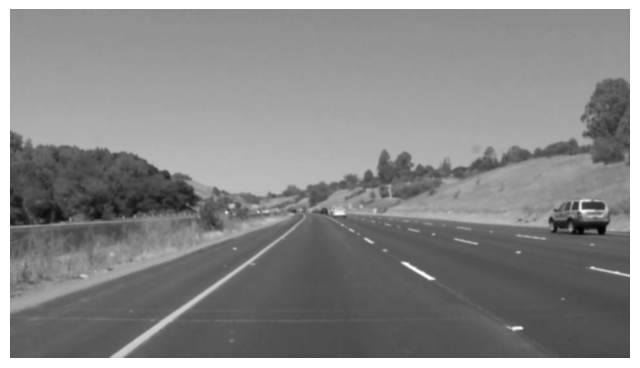

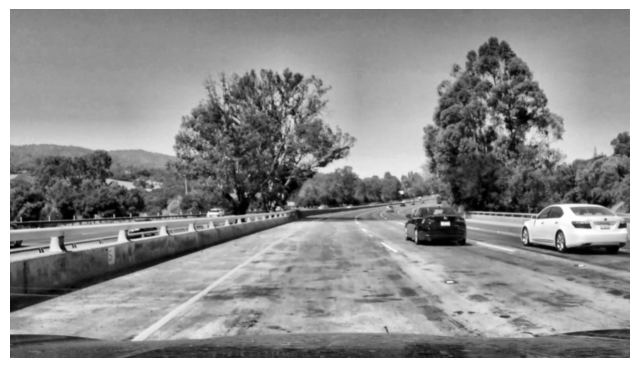

In [98]:
blur_images_sets = []

# gaussian blurring of grey images
for i,g in enumerate(grey_images_sets):
    blur_images = []
    ed,contrast = mean_edge_densities[i],mean_contrast_sets[i]

    # if set contrast high and edge density low, lesser blurring needed
    if (contrast > 60) and (ed < 0.03):
        kernel_size = (7,7)
    # if edge density is high, more blurring needed
    elif ed > 0.08:
        kernel_size = (9,9)
    # otherwise, in the middle, a mid value used
    else:
        kernel_size = (9,9)

    # actual image blurring
    for img in g:
        blur = cv2.GaussianBlur(img,kernel_size,sigmaX=1)
        blur_images.append(blur)
    blur_images_sets.append(blur_images)


# plot_images_from_sets(blur_images_sets[0:5])
plot_random_image_from_sets(blur_images_sets[0], 1)
plot_random_image_from_sets(blur_images_sets[4], 1)


## Detect edges
The next step is to detect edges in the image. In general, the Canny edge detector works well for this operation\

The result should look something like this:
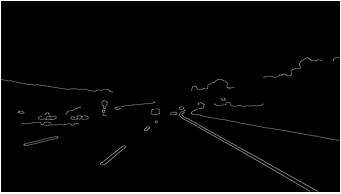

-----
In this cell, to apply edge detection, I varied the parameters based on the mean vertical edge histogram, as calculated prior.

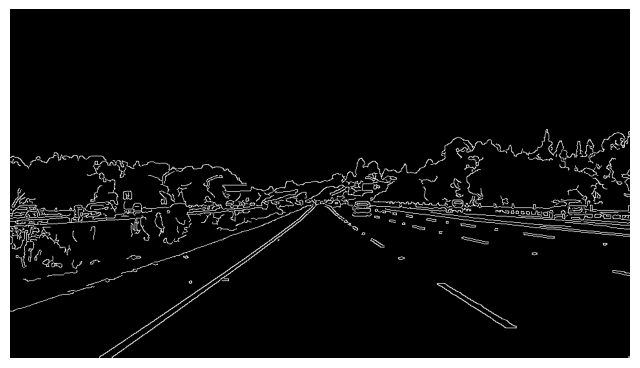

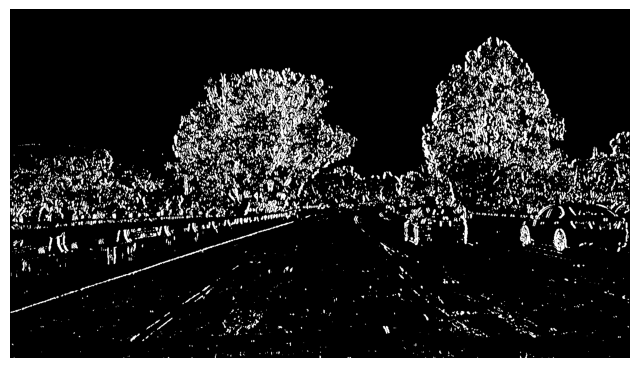

In [99]:
canny_images_sets = []

for mv,b in zip(mean_vertical_edge_hist,blur_images_sets):
    
    #adjusting the canny thresholds based on the vertical edge histogram
    if mv > 320:
        canny_low_threshold = 0
        canny_high_threshold = 0
    elif mv > 270:
        canny_low_threshold = 20
        canny_high_threshold = 100
    else:
        canny_low_threshold = 20
        canny_high_threshold = 60

    canny_images = []

    #attempt to use Sobel vertical edge detection for set 5
    for img in b:
        if canny_low_threshold > 0:
            edges = cv2.Canny(img,canny_high_threshold,canny_low_threshold)
            canny_images.append(edges)
        else:
            sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # dx=1, dy=0 for vertical edges
            sobel_x = cv2.convertScaleAbs(sobel_x)  # Convert to 8-bit absolute value

            # applying thresholding to enhance strong edges
            _, vertical_edges = cv2.threshold(sobel_x, 0, 250, cv2.THRESH_OTSU)
            canny_images.append(vertical_edges)
    canny_images_sets.append(canny_images)




# plot_images_from_sets(canny_images_sets[0:5])
plot_random_image_from_sets(canny_images_sets[0],1)
plot_random_image_from_sets(canny_images_sets[4],1)



## Define region of interest
We only want to look for edges in the road in front of the camera, and we want to ignore edges in the sky, background etc. To do this, we will define a region of interest. All edges outside the region of interest are ignored

The result should look something like this example, where most of the background has been ignored:
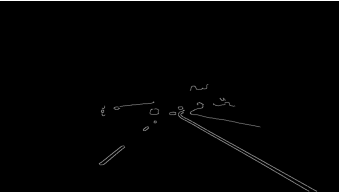


In [87]:

# define a region of interest mask
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon defined by "vertices". 
    The rest of the image is set to black.
    """
    #define a blank mask
    mask = np.zeros_like(img)   
    
    #define a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

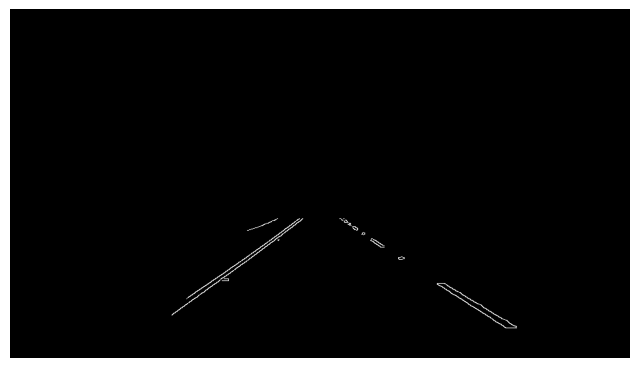

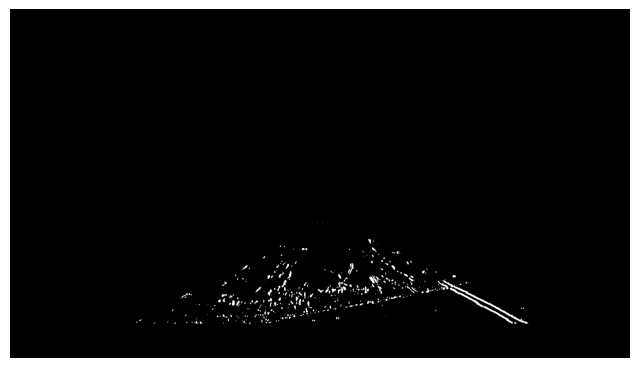

In [100]:
# get the size and shape of one of the images


# apply the mask to the Canny edge images
masked_images_sets = []

for i,c in enumerate(canny_images_sets):
    height = c[0].shape[0]
    width = c[0].shape[1]

    mc = mean_contrast_sets[i]
    
    #polygonal ROI shape used for each solution
    #if contrast is low, a larger ROI is used
    if mc < 45:
        region = np.array([[
                (int(width * 0.2), height),        
                (int(width * 0.4), int(height * 0.6)),
                (int(width * 0.6), int(height * 0.6)),
                (int(width * 0.9), height)         
            ]], dtype=np.int32)
        
    #isolated processing for set 5 to deal with bonnet in frame
    elif i == 4:
        bonnet_height = 0.1 * height

        region = np.array([[ 
            (int(width * 0.2), height - bonnet_height), 
            (int(width * 0.5), int(height * 0.6)),      
            (int(width * 0.5), int(height * 0.6)),      
            (int(width * 0.9), height - bonnet_height)  
        ]], dtype=np.int32)
    
    #otherwise for all other applications use a standard shaped ROI
    else:
        region = np.array([[
            (int(width * 0.1), height),       
            (int(width * 0.4), int(height * 0.4)),
            (int(width * 0.6), int(height * 0.4)),
            (int(width * 1), height)         
        ]], dtype=np.int32)

    masked_images = [region_of_interest(img,[region]) for img in c]#applying the ROI masks
    masked_images_sets.append(masked_images)


# plot_images_from_sets(masked_images_sets[0:5])
plot_random_image_from_sets(masked_images_sets[0],1)
plot_random_image_from_sets(masked_images_sets[4],1)




## Apply Hough Transform
We will use the Hough Transform to detect lines in the image

You should expect to see something that looks like this:
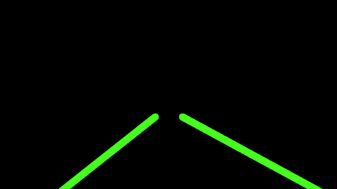

In [89]:
def drawLine(img, x, y, color=[0, 255, 0], thickness=10, line_length = 65):
    if len(x) == 0: 
        return
    
    lineParameters = np.polyfit(x, y, 1) 
    
    m = lineParameters[0]
    b = lineParameters[1]
    
    maxY = img.shape[0]
    maxX = img.shape[1]
    y1 = maxY
    x1 = int((y1 - b)/m)
    y2 = int((maxY/2)) + line_length  # note: hardcoded, sets the length of the line to half the image height + 60 pixels
    x2 = int((y2 - b)/m)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)


# # Helper function - split the detected lines into left and right lines
def draw_lines(img, lines, color=[0, 255, 0], thickness=10, line_length=65):

    leftPointsX = []
    leftPointsY = []
    rightPointsX = []
    rightPointsY = []

    for line in lines:
        for x1,y1,x2,y2 in line:
            m = (y1 - y2)/(x1 - x2)
            
                        
            if m < 0:
                leftPointsX.append(x1)
                leftPointsY.append(y1)
                leftPointsX.append(x2)
                leftPointsY.append(y2)
            else:
                rightPointsX.append(x1)
                rightPointsY.append(y1)
                rightPointsX.append(x2)
                rightPointsY.append(y2)

    drawLine(img, leftPointsX, leftPointsY, color, thickness, line_length=line_length)
        
    drawLine(img, rightPointsX, rightPointsY, color, thickness, line_length=line_length)

    




In [90]:
#adaptive line length propogates through to this function
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, line_length):
    lines = cv2.HoughLinesP(img,rho,maxLineGap=max_line_gap,minLineLength=min_line_len,threshold=threshold,theta=theta)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines, line_length=line_length)
    return line_img

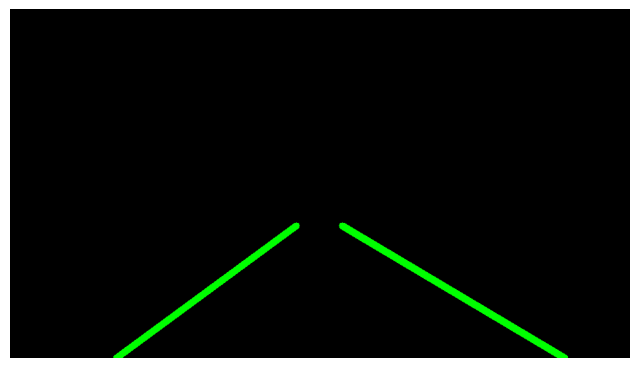

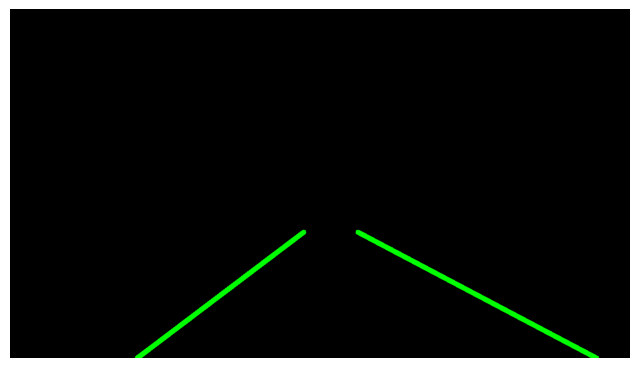

In [101]:
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
hough_images_sets = []


for i,m in enumerate(masked_images_sets):

	hough_images = []
	v = mean_vertical_edge_hist[i]

	#again, chaging the params based on mean vertical edge histogram
	if i == 3:
		threshold = 65  # minimum number of votes (intersections in Hough grid cell)
		min_line_length = 130 # minimum number of pixels making up a line
		max_line_gap = 80 

	elif v < 320:
		threshold = 70   # minimum number of votes (intersections in Hough grid cell)
		min_line_length = 40 # minimum number of pixels making up a line
		max_line_gap = 150   # maximum gap in pixels between connectable line segments
	
	else:
		threshold = 30
		min_line_length = 80
		max_line_gap = 100


	#line length based on image set
	if i == 0:
		line_length = 65
	elif i in [1,2,3]:
		line_length = -65
	else:
		line_length = 100

	#hough line calculation
	for i,mask in enumerate(m):
		hough_img = hough_lines(mask, rho, theta, threshold, min_line_length, max_line_gap, line_length)
		hough_images.append(hough_img)
	hough_images_sets.append(hough_images)


# display Hough line images
# plot_images_from_sets(hough_images_sets[0:5])
plot_random_image_from_sets(hough_images_sets[0],1)
plot_random_image_from_sets(hough_images_sets[4],1)

## Plot the Hough Lines on the original images
Now that we have detected the lines, we will overlay them on the original images.

Bringing it all together:

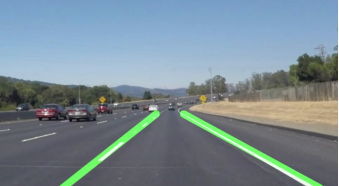

Note: In your *submitted* Jupyter Notebook, in this section you should include graphs of all images in the 5 test sets, with the "overlay" of the detected lane markings on the original image (up to 25 images). 
For the intermediate stages of processing, it is sufficient to include plots of two test images, one "easy" and one "hard" in your submitted notebook. However, during development of your code, you will of course need to test all 25 test images to make sure your algorithm is working correctly.  

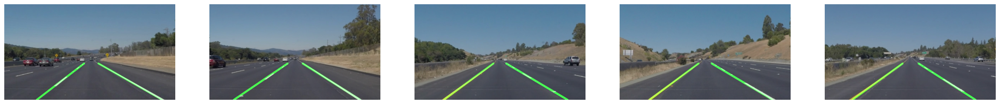

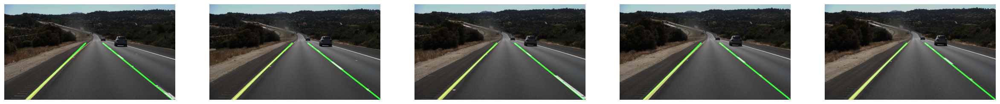

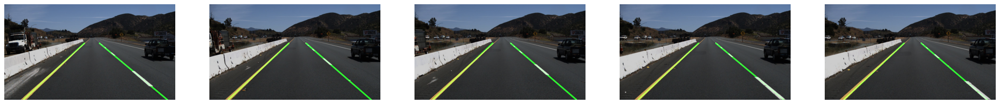

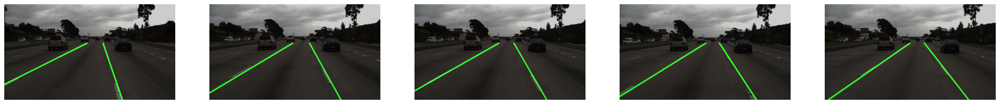

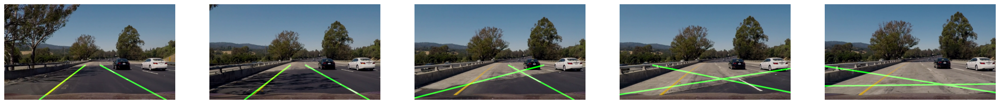

In [102]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

final_images_sets = []


# use the addWeighted function to overlay the Hough lines onto the original 
for i,(raw_set, hough_set) in enumerate(zip(raw_images_sets, hough_images_sets)):
    final_images = []
    for j,(raw_img, hough_img) in enumerate(zip(raw_set, hough_set)):

        merged_image = cv2.addWeighted(raw_img, α, hough_img, β, λ)
        changed_image = cv2.cvtColor(merged_image,cv2.COLOR_BGR2RGB)
        final_images.append(changed_image)
    final_images_sets.append(final_images)

    
plot_images_from_sets(final_images_sets[0:5])

# plot_random_image_from_sets(final_images_sets[0],1)
# plot_random_image_from_sets(final_images_sets[4],1)

## More Sophisticated Solution for Set 5 - HLS Colour Space Masking

In [93]:
#load and convert images to uint8
set5_images = [plt.imread(img) for img in glob.glob('C:/Users/athen/Desktop/MAI_Sem1/EIP/Assignment3/Assignment_3___Lane_Detection_export/images/set_5/*.png')]
set5_images = [(img*255).astype(np.uint8) for img in set5_images]



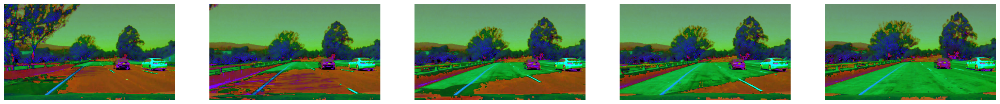

In [94]:
# conversion helper function
def convert_hsl(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

plot_images_from_sets(list(map(convert_hsl, set5_images)))

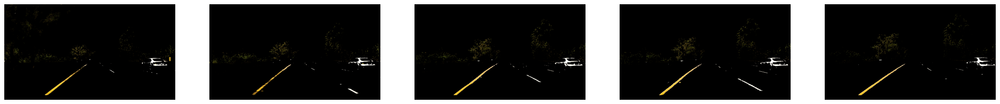

In [95]:
#function keep yellow and white from the hls converted image by using thresholds and masks 
def HSL_color_selection(image):
   
    converted_image = convert_hsl(image)#hls conversion
    
    #colour mask to keep white in image
    lower_w = np.uint8([190, 190, 190])
    upper_w = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted_image, lower_w, upper_w)
    
    #colour mask to keep yellow in image
    lower_y = np.uint8([15, 0, 110])
    upper_y = np.uint8([35, 255, 255])
    yellow_mask = cv2.inRange(converted_image, lower_y, upper_y)
    

    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask = mask)
    
    return masked_image

csi = list(map(HSL_color_selection, set5_images))#for later processing
plot_images_from_sets(csi)


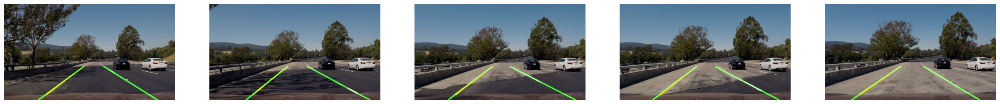

In [96]:
grey = [cv2.cvtColor(img,cv2.COLOR_RGB2GRAY) for img in csi]#greyscale conversion
gauss = [cv2.GaussianBlur(img,(13,13),0) for img in grey]#gaussian blurring
canny = [cv2.Canny(img,75,200) for img in gauss]#edge detection


#including the bonnet in the region of interest
bonnet_height = 0.1 * height
region_5 = np.array([[ 
    (int(width * 0.2), height - bonnet_height), 
    (int(width * 0.5), int(height * 0.6)),      
    (int(width * 0.5), int(height * 0.6)),     
    (int(width * 0.9), height - bonnet_height)  
]], dtype=np.int32)

roi = [region_of_interest(img,region_5) for img in canny]#masking the roi images
hough = [hough_lines(img,1,(np.pi/180),25,25,275, line_length=110) for img in roi]#calculating the hough lines

set5 = sets[-1]#getting raw images for merging
set5_images = []

#merging the raw images and the hough lines
for j,(raw_img, hough_img) in enumerate(zip(set5, hough)):
    merged_image = cv2.addWeighted(raw_img, α, hough_img, β, λ)
    changed_image = cv2.cvtColor(merged_image,cv2.COLOR_BGR2RGB)
    set5_images.append(changed_image)


plot_images_from_sets(set5_images)


-----------------------
## Most Sophisticated Solution For Set 5 - Bird's Eye View Transformation with Polynomial Curve Fitting 

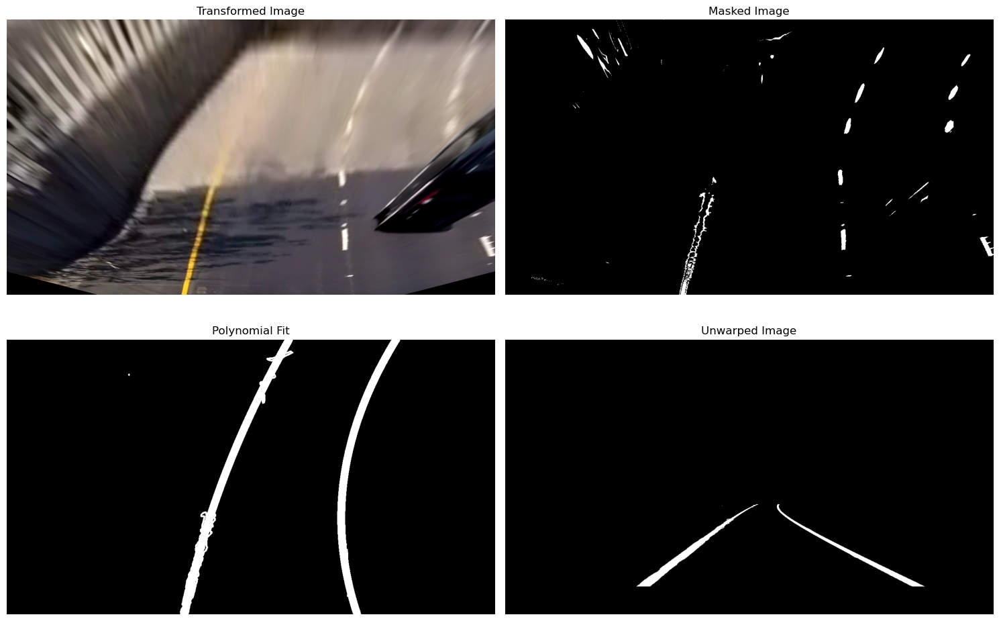

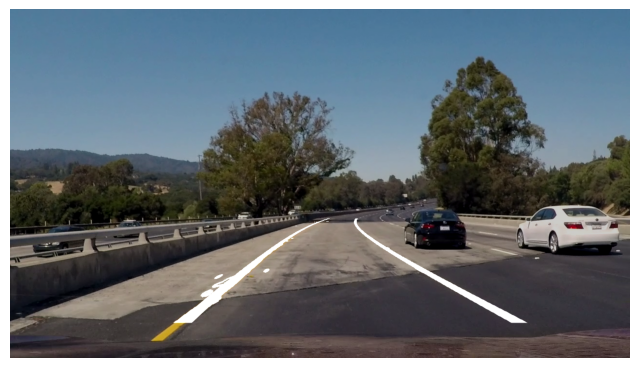

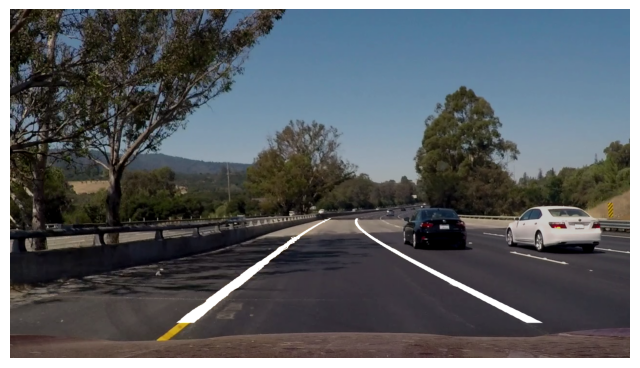

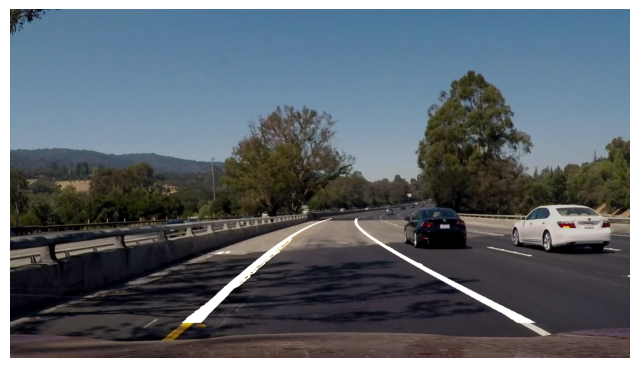

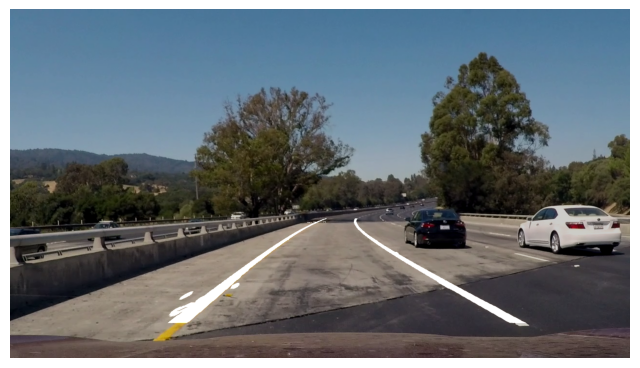

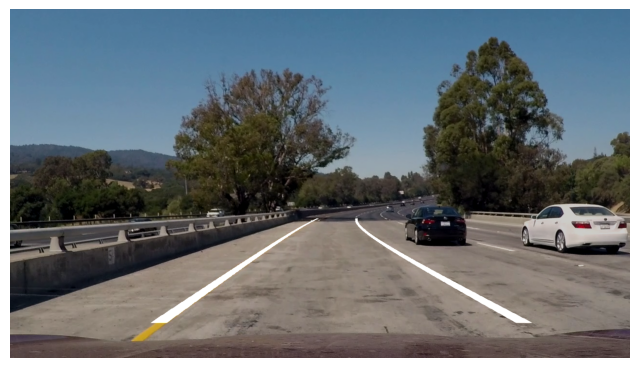

In [97]:
# Sample image
sample_bev_image = raw_images_sets[4][0]

# Function to define the perspective transform
def get_perspective_transform(image):
    
    # Define the source points (corners of trapezoidal region in the original image)
    src = np.float32([
        [image.shape[1] * 0.45, image.shape[0] * 0.6],
        [image.shape[1] * 0.55, image.shape[0] * 0.6],  
        [image.shape[1] * 0.9, image.shape[0] * 0.9],   
        [image.shape[1] * 0.1, image.shape[0] * 0.9]  
    ])
    
    # Define the destination points (a rectangle in the bird's-eye view)
    dst = np.float32([
        [image.shape[1] * 0.25, 0],
        [image.shape[1] * 0.75, 0],                    
        [image.shape[1] * 0.75, image.shape[0]],         
        [image.shape[1] * 0.25, image.shape[0]]  
    ])
    
    # Compute the perspective transform matrix and inverse matrix for reversion
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    return M, M_inv

# Warp perspective of source image using calculated matrix 
def warp_perspective(image, M):
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]))
    return warped

#fitting a 2nd order polynomial function to both the right and left lane lines in the image
def fit_polynomial(warped_ed_img):

    mp = warped_ed_img.shape[1] // 2 + 120 #midpoint of image plus scalar val for customisation
    roi = np.zeros_like(warped_ed_img)
    _, width = warped_ed_img.shape

    roi[0:, int(width/4):int(3*width/4)] = 1#roi mask

    masked_edges = cv2.bitwise_and(warped_ed_img, warped_ed_img, mask=roi)#mask application

    #finding non zero points in image on left and right of mp
    right_points = np.column_stack(np.where(masked_edges[:, mp:] > 0))
    right_points[:, 1] += mp
    left_points = np.column_stack(np.where(masked_edges[:, :mp] > 0))

    
    #fitting and drawing polynomial for right points
    if right_points.size > 0:
        right_fit = np.polyfit(right_points[:, 0], right_points[:, 1], 2)
        
        plot_y = np.linspace(0, masked_edges.shape[0] - 1, masked_edges.shape[0])
        plot_x = right_fit[0] * plot_y**2 + right_fit[1] * plot_y + right_fit[2]
        
        for x, y in zip(plot_x, plot_y):
            if 0 <= x < masked_edges.shape[1] and 0 <= y < masked_edges.shape[0]:
                cv2.circle(masked_edges, (int(x), int(y)), 10, (255, 0, 0), -1)
        for rp in right_points:
            cv2.circle(masked_edges, (rp[1], rp[0]), 2, (255, 0, 0), -1)
    

    #fitting and drawing the polynomial for left points
    if left_points.size > 0:
        left_fit = np.polyfit(left_points[:, 0], left_points[:, 1], 2)
        plot_y = np.linspace(0, masked_edges.shape[0] - 1, masked_edges.shape[0])
        plot_x = left_fit[0] * plot_y**2 + left_fit[1] * plot_y + left_fit[2]
        
        for x, y in zip(plot_x, plot_y):
            if 0 <= x < masked_edges.shape[1] and 0 <= y < masked_edges.shape[0]:
                cv2.circle(masked_edges, (int(x), int(y)), 10, (255, 0, 0), -1)
        for lp in left_points:
            cv2.circle(masked_edges, (lp[1], lp[0]), 2, (255, 0, 0), -1)

    return masked_edges, right_fit, left_fit
    
#helper to revent perspective transform using the inverse transform matrix
def revert_perspective_transform(image, M_inv):
    unwarped = cv2.warpPerspective(image, M_inv, (image.shape[1], image.shape[0]))
    return unwarped

final_final_images = []

#colour ranges for masking in the transformed space
lower_white = np.array([0, 200, 0])
upper_white = np.array([255, 255, 255])

lower_yellow = np.array([10, 0, 75])
upper_yellow = np.array([50, 255, 255])

#set5 images to be transformed
images = raw_images_sets[4]

#pipeline for transformation, lane detection and drawing
for i,image in enumerate(images):
    M, M_inv = get_perspective_transform(image)#perspective transform matrix calc
    warped = warp_perspective(image, M)#applying perspective transform matrix

    # Mask white and yellow lanes separately.then combine 
    mask_white = cv2.inRange(warped, lower_white, upper_white)
    mask_yellow = cv2.inRange(warped, lower_yellow, upper_yellow)
    mask_combined = cv2.bitwise_or(mask_white, mask_yellow)

    #blur and edge detection
    gauss_curve = cv2.GaussianBlur(mask_combined, (15, 15), 0)
    canny_curve = cv2.Canny(gauss_curve, 40, 150)

    me, lf, rf = fit_polynomial(canny_curve) #fitting polynomial to edge detection

    unwarped = revert_perspective_transform(me, M_inv) #undoing transform with lane detections

    if len(unwarped.shape) == 2:  # If unwarped_resized is grayscale
        unwarped = cv2.cvtColor(unwarped, cv2.COLOR_GRAY2BGR)

    merged_image = cv2.addWeighted(image, α, unwarped, β, λ)#merge lines and original images
    final = cv2.cvtColor(merged_image, cv2.COLOR_BGR2RGB)
    final_final_images.append(final)

    #plotting one sample image for each operation to show how it works
    if i==0:
        fig, axs = plt.subplots(2, 2, figsize=(15, 10))
        axs[0, 0].imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        axs[0, 0].set_title('Transformed Image')
        axs[0, 1].imshow(mask_combined, cmap='gray')
        axs[0, 1].set_title('Masked Image')
        axs[1, 0].imshow(me, cmap='gray')
        axs[1, 0].set_title('Polynomial Fit')
        axs[1, 1].imshow(cv2.cvtColor(unwarped, cv2.COLOR_BGR2RGB))
        axs[1, 1].set_title('Unwarped Image')

        for ax in axs.flat:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

plot_random_image_from_sets(final_final_images,5)


## Summary of findings, and other remarks

Comment on the performance of the line detector: 
- In what scenarios (i.e. test sets) does it work well?
- In what scenarios (i.e. test sets) does it not work? 
- Comment on why this implementation does not work in some scenarios
- Set 5 images are more challenging due to road surface and contrast changes. You may need to make your aproach more "sophisticated" to account for this.
- Vary the threshold parameters of the Canny edge detector, and comment on the impact on the lane detection performance
- Vary the parameters used by the cv2.HoughLinesP function (rho, theta, threshold etc), and comment on the impact on the lane detection performance
- Suggest methods to improve the performance of this lane detector. Specifically, consider how you would make the detector more robust against changes in contrast, lighting etc

----------




#### IN WHAT SCENARIOS DOES IT WORK WELL?
This implementation works very well in situations with consistent and favourable environmental conditions, such as lighting, road surface and camera field of view. In the first four sets of images these conditions are stable enough to allow a traditional approach to work as intended without too much alteration.



#### IN WHAT SCENARIOS DOES IT NOT WORK WELL?
However, in the fifth set of images, these conditions deteriorate sufficiently causing significant issues with a traditional approach, with the techniques applied previously to the other four sets. High edge densities in regions close to the desired edges, numerous distracting high contrast regions and multiple other factors are the cause of this. 



#### COMMMENT ON WHY THIS IMPLEMENTATION DOES NOT WORK IN SOME SCENARIOS?
This implementation does not work in some scenarios here, as mentioned, for a variety of reasons, including;
 - The uneven nature of the road surface results in the detection of unwanted high edge density in the image, obscuring the desired edges, the lane lines.
 - The transition between light areas and darker, shadowed regions (high contrast) causes the detection of further, distracting edges which sometimes do not really exist, making the correct edge detections even more difficult.
 - The lane lines in the fifth image set are also on a curve, making their accurate detection with the previously used techniques impossible, unless a more sophisticated method of drawing the lines was implemented. 

In an attempt to remedy the uneven nature of the lighting in set 5, I tried to use CLAHE to boost contrast in order to detect lane lines in bright regions. This helped to a certain degree, however like other measures I will discuss, failed to make the solution operational.


#### VARY THE THRESHOLD PARAMETERS OF THE CANNY EDGE DETECTION AND COMMENT ON THE IMPACT OF THE LANE DETECTION PERFORMANCE
For different image sets I varied the low and high threshold's of the Canny edge detector in order to vary it's behaviour to suit the characteristics of each set of images. For sets with a lower value from the mean vertical edge histogram calculation I used a high threshold of 60 and a low threshold of 20 and for sets with a lower value from the histogram a low of 20 and a high of 100 was used. The higher the value returned from the mean vertical edge histogram calculation, the lower the high threshold was required to be, therefore the less strong edges were necessary to be detected. 

For set 5, I also attempted to use Sobel edge detection instead of the Canny implementation to strengthen the detection of vertical edges by choosing the vertical Sobel operator(s). This, combined with Otsu thresholding, gave stronger lines than any Canny implementation I could find, however it was still very far from perfect, only detecting 4 or 5 out of 10 lines correctly.



#### VARY THE PARAMETERS USED BY THE CV2.HOUGHLINES FUNCTION (RHO, THETA, THRESHOLD ETC.), AND COMMENT ON THE IMPACT ON THE LANE DETECTION PERFORMANCE
I also varied each of the parameters required for the houghlines() function, these were my findings for each parameter:
 - rho -> rho is the distance resolution of the hough transform's accumulator, in pixels, meaning the lower the value the more precise the detections are but the more computationally expensive also. I used a value of 1 as it provided me the best results, while maintaining a reasonable runtime.
 - theta -> similarly, theta is the angular resolution of the accumulator in radians. Again, the smaller the resolution value, the higher the angular resolution the detections will have and again, I settled on the min value of 1 degree for the same reasons as above. 

 - threshold -> the threshold value, or the number of intersections/votes needed in the Hough accumulator for a valid line to be determined, was also altered for differing scenarios in my solution. 
 - min line length -> the minimum length in pixels needed for a line to be deemed valid.
 
 I again used the vertical edge histogram values to determine the levels needed to adjust these parameters.
 

#### SUGGEST METHODS TO IMPROVE THE PERFORMANCE OF THIS LANE DETECTOR. SPECIFICALLY CONSIDER HOW YOU WOULD MAKE THE DETECTOR MORE ROBUST AGAINST CHANGES IN CONTRAST, LIGHTING ETC.
I used two 'more sophisticated' solutions to process set 5 in search of better results. One such way to deal with the issues of contrast and lighting, is using the HLS colorspace. Generated colour masks are relatively unaffected by large changes in these conditions (lighting, rough surfaces etc.), which means that they can be used as seeds for much stronger performing edge detection, as shown above. This method produced perfect line detections for set 5, minus the ability to track curved lines.

In order to make the best lane detection possible for set 5, I then settled on using a Bird's Eye View image transform to gain a better vantage point on the curve of the lines, by removing the convergence of the lines at the horizon and flattening the overall perspective of the image. Following this transformation I fitted a second order polynomial to the non zero points detected in either half of the image. This tracked the curvature of each lane line independently from the other. This method performed extremely well, as if I needed to choose a method to be fully fleshed out into an implemented product, it would be this one.

Another much stronger technique for this problem, and the current state-of-the-art approach, given the required resources, would be to deploy a deep learning model, usually a CNN or some closely related model, to extract features from and classify small image patches as lane or non-lane. This approach also outperforms segmentation models, which were themselves top of the food chain for a period. 

Finally, were I absolutely hell bent on getting the traditional method to work for all five sets, which I believe to be a pointless quest as it can be done easier and more effectively otherwise, I would potentially try to prevent the drawing of lines with incorrect slopes or try to join smaller detected line segments by searching for others along the same trajectory. 